In [1]:
import os
import numpy as np
import pandas as pd
import sys

from matplotlib import pyplot
from matplotlib import cm
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import seaborn as sns

from scipy.stats import f_oneway
import scikit_posthocs as sp

In [2]:
import hvplot.pandas

In [3]:
def load_errlist(csv_filepath):
    stats = pd.read_csv(csv_filepath)
    
    repeat_idx = np.unique(stats['repeat'].values)
    d_list = np.unique(stats['dimension'].values)
    W_beta_list = np.unique(stats['W_beta'].values)
    Q_beta_list = np.unique(stats['Q_beta'].values)

    train_err_list = []
    valid_err_list = []

    for d in d_list:
        for bw in W_beta_list:
            for bq in Q_beta_list:
                for r in repeat_idx:
                    per_stats = stats.loc[ (stats['repeat'] == r) &
                                           (stats['dimension'] == d) &
                                           (stats['W_beta'] == bw) &
                                           (stats['Q_beta'] == bq) ]

                    if per_stats.shape[0] > 0:
                        per_stats = per_stats.mean()
                        train_err_list.append([d, bw, bq, per_stats['train_error']]) 
                        valid_err_list.append([d, bw, bq, per_stats['valid_error']])
                    #else:
                    #    print(d, bw, bq, r)

    train_err_list = np.stack(train_err_list)
    valid_err_list = np.stack(valid_err_list)
    train_err_list = pd.DataFrame(train_err_list, columns=['dimension','bw','bq','error'])
    valid_err_list = pd.DataFrame(valid_err_list, columns=['dimension','bw','bq','error'])
    return stats, train_err_list, valid_err_list

def show_stats(train_err_list, valid_err_list):
    for bw in np.unique(valid_err_list['bw'].values):
        nq = len(np.unique(valid_err_list['bq'].values))
        fig, ax = pyplot.subplots(nrows=1, ncols=nq, figsize=(10, 2), sharey=True)

        for (idx,bq) in enumerate(np.unique(valid_err_list['bq'].values)):
            sns.lineplot(data=valid_err_list.loc[(valid_err_list['bw'] == bw) & (valid_err_list['bq'] == bq)],
                         x="dimension", y="error", hue='bq', palette="tab10", markers=True, ax=ax[idx], legend=False)
            sns.lineplot(data=train_err_list.loc[(train_err_list['bw'] == bw) & (train_err_list['bq'] == bq)],
                         x="dimension", y="error", hue='bq', palette=sns.color_palette("hls", 1), markers=True, ax=ax[idx], legend=False)
            if idx == 0:
                ax[idx].set_title('beta W={}\n beta Q={}'.format(bw, bq))
            else:
                ax[idx].set_title('beta Q={}'.format(bq))
            ax[idx].set_xticks(np.unique(valid_err_list['dimension'].values))
        pyplot.show()

        
def show_distribution(stats):
    
    repeat_idx = np.unique(stats['repeat'].values)
    d_list = np.unique(stats['dimension'].values)
    W_beta_list = np.unique(stats['W_beta'].values)
    Q_beta_list = np.unique(stats['Q_beta'].values)
    
    output_validation = []

    for d in d_list:
        train_err_list = []
        valid_err_list = []
        for r in repeat_idx:
            for bw in W_beta_list:
                for bq in Q_beta_list:
                    per_stats = stats.loc[ (stats['repeat'] == r) &
                                           (stats['dimension'] == d) &
                                           (stats['W_beta'] == bw) &
                                           (stats['Q_beta'] == bq) ]

                    if len(per_stats) > 0:
                        per_stats = per_stats.mean()
                        train_err_list.append([d, bw, bq, per_stats['train_error']])
                        valid_err_list.append([d, bw, bq, per_stats['valid_error']])

        train_err_list = np.stack(train_err_list)
        valid_err_list = np.stack(valid_err_list)

        for i in range(len(W_beta_list)):
            distribution_list = []
            setting_list = []

            fig, ax = pyplot.subplots(nrows=1, ncols=len(Q_beta_list), figsize=(10, 1), sharey=True)

            for j in range(len(Q_beta_list)):
                bw = W_beta_list[i]
                bq = Q_beta_list[j]
                idx = np.where( (valid_err_list[:,1] == bw) & (valid_err_list[:,2] == bq) )[0]

                sns.histplot(valid_err_list[idx,3], ax=ax[j], kde=True, bins=20)
                ax[j].set_title(str(bq)+', '+str(np.round(np.mean(valid_err_list[idx,3]),3)))
                if j == 0:
                    ax[j].set_ylabel('d={}\n beta W={}'.format(d, bw))
                ax[j].set_yticks([])
                
                # if d == 2 and j == 2:
                if d == 2:
                    output_validation.append(valid_err_list[idx,3])
                
            pyplot.show()
    return output_validation
                       
            


# 1. Load Inputs

## 1.1. Load Questionnaire item labels

In [6]:
question_list = pd.read_csv('./data/snycq.csv').columns[2:]
print(question_list)
print(len(question_list))

Index(['Positive', 'Negative', 'Future', 'Past', 'Myself', 'People',
       'Surroundings', 'Images', 'Words', 'Specific', 'Intrusive'],
      dtype='object')
11


## 1.2. Load Original Demographic information

In [7]:
demo_csv = pd.read_csv('./data/participants_post_motion_QA.csv')
demo_csv.head(5)

,Subject,gender,age (5-year bins)
0,sub-010014,M,20-25
1,sub-010080,F,30-35
2,sub-010082,F,25-30
3,sub-010084,F,20-25
4,sub-010015,M,20-25


## 1.3. Load sNYCQ Answers

In [8]:
data_csv = pd.read_csv('./data/snycq.csv', index_col=['Subject','Run'])
print(data_csv.shape)
data_csv.head(3)

(471, 11)


Positive  Negative  Future  Past  \
Subject    Run                                                           
sub-010014 post-ses-02-run-01-acq-AP      80.0      15.0    50.0  55.0   
           post-ses-02-run-01-acq-PA      60.0      10.0    75.0  70.0   
           post-ses-02-run-02-acq-AP      55.0      60.0    65.0  40.0   

                                      Myself  People  Surroundings  Images  \
Subject    Run                                                               
sub-010014 post-ses-02-run-01-acq-AP    30.0    65.0          55.0    95.0   
           post-ses-02-run-01-acq-PA    65.0    65.0          80.0    95.0   
           post-ses-02-run-02-acq-AP    50.0    60.0          65.0    75.0   

                                      Words  Specific  Intrusive  
Subject    Run                                                    
sub-010014 post-ses-02-run-01-acq-AP   90.0      25.0       30.0  
           post-ses-02-run-01-acq-PA   85.0      25.0       55.0  
           post-ses-02-run-02-acq-AP   85.0      30.0       60.0

# 2. Load Outputs (provided by the MLT group) - Confound Modeling Scenario

MLT provided us with two solutions, one modeling demographic confounds, and one without. We decided to work with the one with confounds becuase it seems a more complete solution

In [9]:
data = np.load('./output/full_data.npz')
M        = data['M']          # Same as data_csv
nan_mask = data['nan_mask']   # All ones, as there are no missing values
confound = data['confound']   # Original encoding of Gender (1=Male, 0=Female) & Age (0.07 = 20-25 | 0.21 = 25-30 | 0.36 = 30-35 | 0.5 = 35-40 | 0.64 = 40-45 | 0.79 = 45-50 | 0.93 = 50-55 | 1 = 60-65) per scan

Sanity check, that inputs agree

In [17]:
assert np.all(np.equal(M,data_csv.values)), "++ ERROR: The data I provided to MLT, and the data they used as input to the sbcNNMF algorithm differs"

Load and show the demographic information

In [18]:
confound_df = pd.DataFrame(confound, index=data_csv.index, columns=['Age','Gender'])
confound_df.head(10)

Age  Gender
Subject    Run                                        
sub-010014 post-ses-02-run-01-acq-AP  0.071429     1.0
           post-ses-02-run-01-acq-PA  0.071429     1.0
           post-ses-02-run-02-acq-AP  0.071429     1.0
           post-ses-02-run-02-acq-PA  0.071429     1.0
sub-010080 post-ses-02-run-02-acq-AP  0.357143     0.0
           post-ses-02-run-02-acq-PA  0.357143     0.0
sub-010082 post-ses-02-run-01-acq-AP  0.214286     0.0
           post-ses-02-run-01-acq-PA  0.214286     0.0
           post-ses-02-run-02-acq-PA  0.214286     0.0
sub-010084 post-ses-02-run-01-acq-AP  0.071429     0.0

### Search Space
| Hyperparameter | Symbol | Space |
|----------------|-----|---------|
| Dimensionality | d | 1,2,3,4 |
| Sparsity for W | $$\beta_{W}$$ | 0.0, 0.01, 0.1, 1, 2, 3 |
| Sparsity for Q | $$\beta_{Q}$$ | 0.0, 0.01, 0.1, 1, 2, 3 |
| Confound Combination | |  No Confound or Intercept modeling, Intercept modeling only, Confound & Intercept modeling |

Number of iterations = 50
Number of folds = 10

# 3. Results for full confound modeling

In [19]:
stats, train_err_list, valid_err_list = load_errlist('./output/biowulf/stats_full_data.csv')

In [21]:
# Print number of missing --> For some combinations of (d, b_W, b_Q), in some iterations no folds completed. Why?
N_expected = 4 * 6 * 6 * 50 * 10
N_expected - stats.shape[0]

80

In [30]:
valid_err_list

,dimension,bw,bq,error
0,1.0,0.0,0.0,1177.244752
1,1.0,0.0,0.0,1177.580616
2,1.0,0.0,0.0,1187.534973
3,1.0,0.0,0.0,1183.778809
4,1.0,0.0,0.0,1181.986247
...,...,...,...,...
7187,4.0,3.0,3.0,1535.786293
7188,4.0,3.0,3.0,1525.857787
7189,4.0,3.0,3.0,1532.921634
7190,4.0,3.0,3.0,1524.682855


In [65]:
from plotly.express import scatter_3d

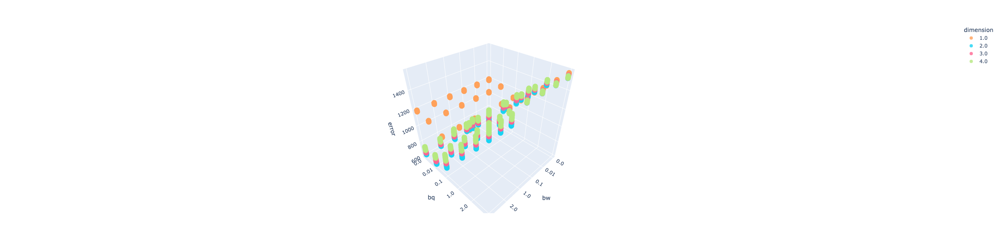

In [103]:
a = valid_err_list.copy()
a['bw'] = a['bw'].astype('str')
a['bq'] = a['bq'].astype('str')
a['dimension'] = a['dimension'].astype('str')

scatter_3d(a,x='bw',y='bq',z='error', color='dimension', width=600, height=600, color_discrete_map={'1':'blue','2':'red','3':'green','4':'black'}, opacity=0.8)

Text(0.5, 0, '$\\beta_{W}$')

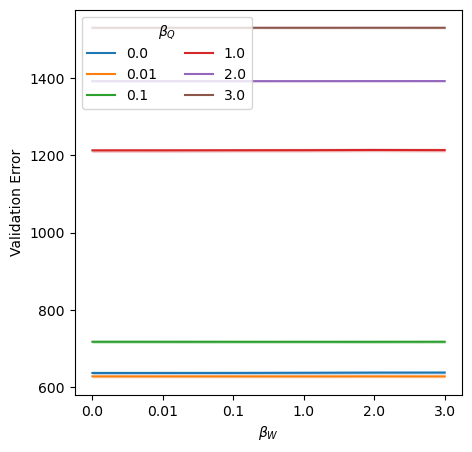

In [101]:
fig, ax = pyplot.subplots(1,1,figsize=(5,5))
a = valid_err_list.copy()
a = a[a['dimension']==2]
a.drop('dimension',axis=1,inplace=True)
a['bw'] = a['bw'].astype('str')
a['bq'] = a['bq'].astype('str')
plot = sns.lineplot(data=a,y='error',x='bw', hue='bq', ax=ax)
ax.legend(loc='upper left',ncol=2, title=r"$\beta_{Q}$")
ax.set_ylabel('Validation Error')
ax.set_xlabel(r"$\beta_{W}$")

In [104]:
# Given what we see above, looks like we can focus on d=2 and bq <=0.1.
# We now check if there are statistical differences between the remaining configurations
set_of_interest = valid_err_list.set_index(['dimension','bq','bw']).loc[2.0,0.01,:].sort_index() #.loc[2.0,[0.0,0.01,0.1],:].sort_index()
set_of_interest_dict = {}
set_of_interest_means = pd.Series(dtype='float64')

for d,bq,bw in set_of_interest.index:
    set_of_interest_dict[(d,bq,bw)]= set_of_interest.loc[d,bq,bw].values
set_of_interest_list = [v.flatten() for k,v in set_of_interest_dict.items()]
set_of_interest_labels = ['bW={b_W},bQ={b_Q}'.format(b_W=b_W, b_Q=b_Q) for d,b_Q,b_W in set_of_interest_dict.keys()]

In [105]:
set_of_interest_means = pd.Series(dtype='float64', index=set_of_interest_labels)
for d,bq,bw in set_of_interest.index:
    set_of_interest_means['bW={bw},bQ={bq}'.format(bw=bw, bq=bq)] = set_of_interest_dict[(d,bq,bw)].mean()

In [106]:
set_of_interest_means.sort_values().head(5)

bW=3.0,bQ=0.01     627.375365
bW=0.0,bQ=0.01     627.394510
bW=1.0,bQ=0.01     627.400062
bW=0.01,bQ=0.01    627.400556
bW=0.1,bQ=0.01     627.406138
dtype: float64

In [107]:
f_oneway(*set_of_interest_list)

F_onewayResult(statistic=0.00040458329881065225, pvalue=0.9999999900919291)

In [108]:
#Now that we know there are statistical differences, we will do post-hoc t-tests between all cases to see which ones are the most useful
pval_df = sp.posthoc_ttest(set_of_interest_list, p_adjust = 'bonferroni')
pval_df.columns = set_of_interest_labels
pval_df.index   = set_of_interest_labels

(<AxesSubplot:>, <matplotlib.colorbar.Colorbar at 0x2aab0eee4d50>)

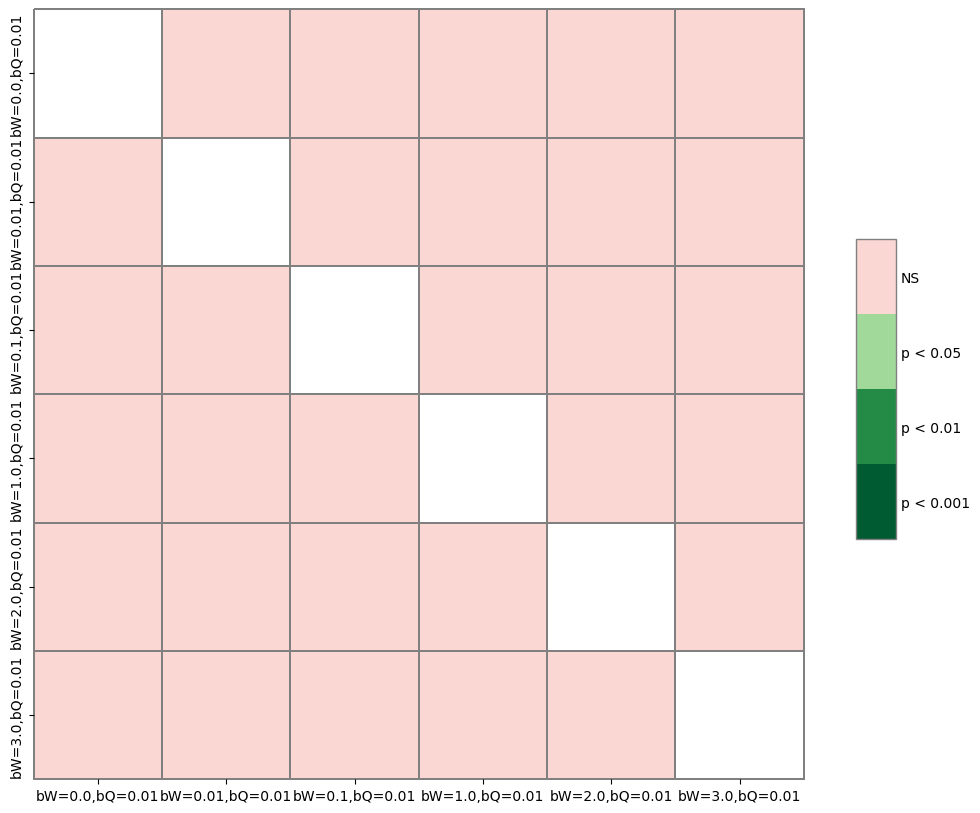

In [109]:
fig,ax=pyplot.subplots(1,1,figsize=(10,10))
heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [.95, 0.35, 0.04, 0.3], 'ax':ax}
sp.sign_plot(pval_df, **heatmap_args)

> RESULT: Confounds | bQ = 0.01 | bW = 0

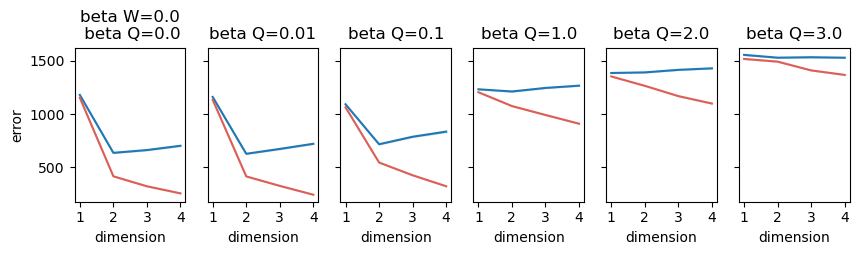

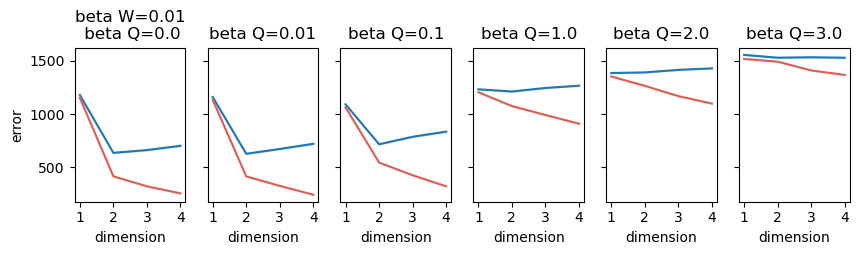

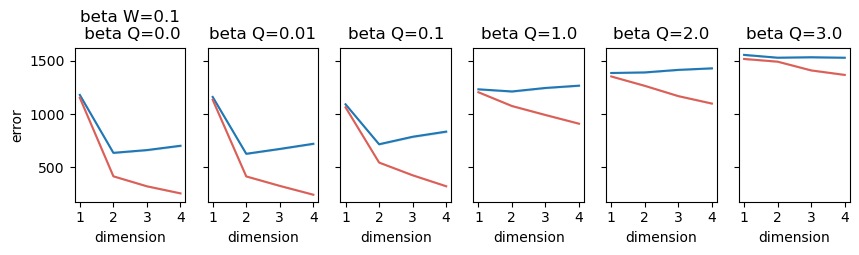

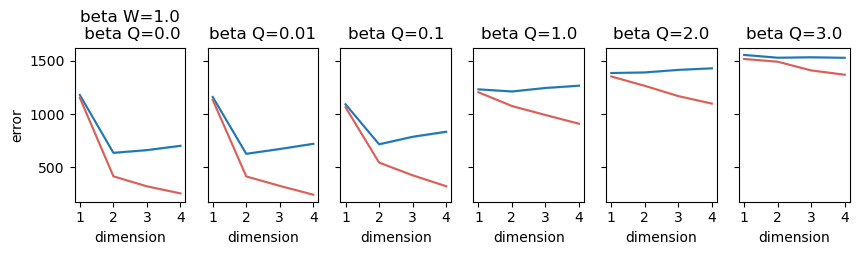

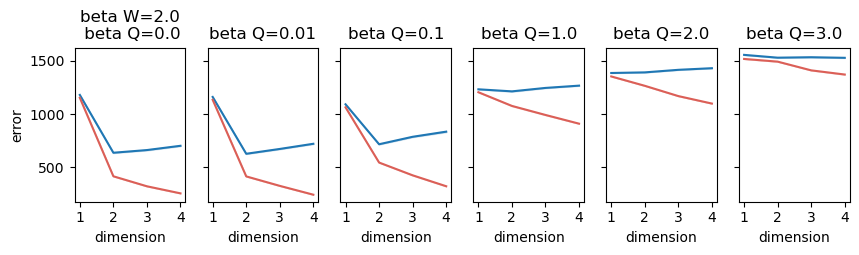

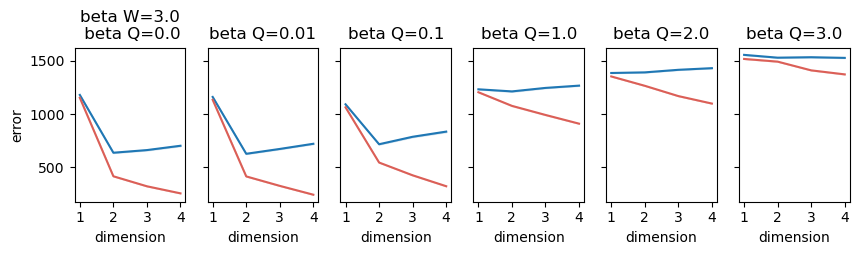

In [31]:
show_stats(train_err_list, valid_err_list)

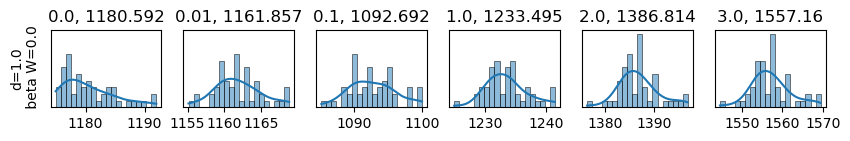

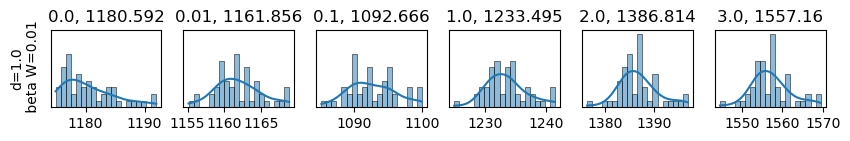

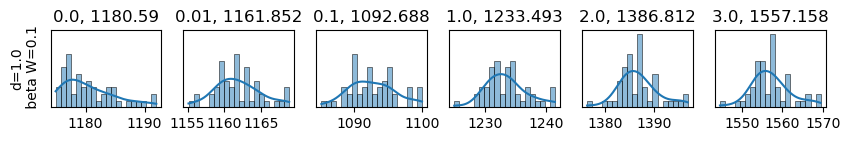

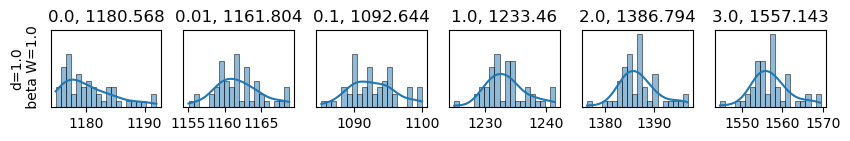

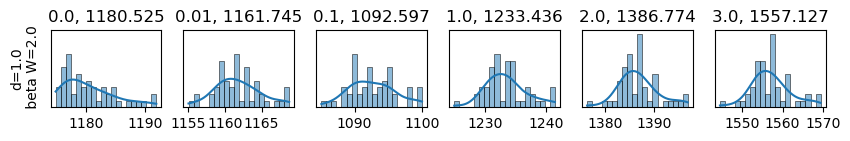

...

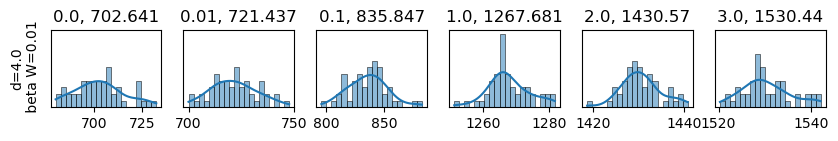

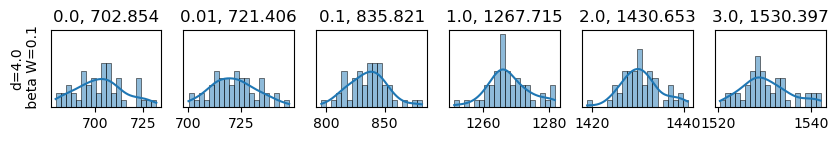

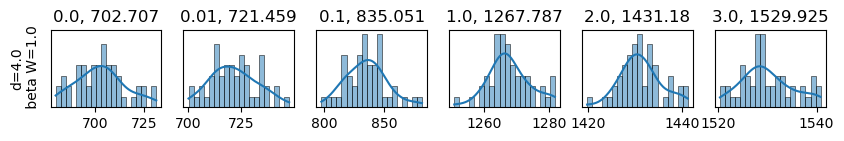

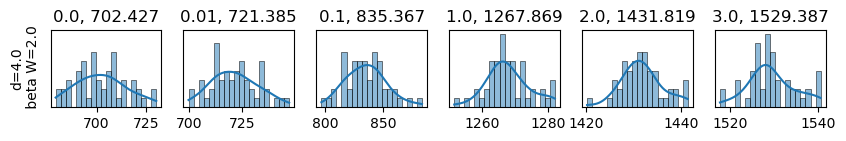

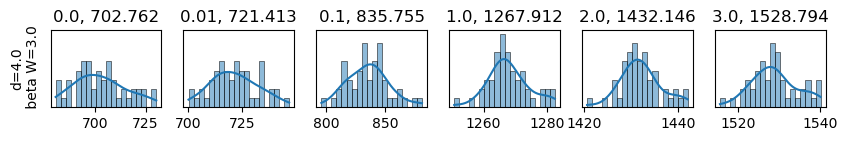

In [32]:
output_validation = show_distribution(stats)

In [33]:
f_oneway(*output_validation)

F_onewayResult(statistic=101344.94271818879, pvalue=0.0)

In [34]:
print([np.mean(v) for v in output_validation])
pval_df = sp.posthoc_ttest(output_validation, p_adjust = 'bonferroni')

[636.2979053020443, 627.3945100888554, 717.1032141272163, 1212.9824101947415, 1392.3614309654454, 1530.7186501242434, 636.3024938632549, 627.4005562204471, 717.1068432869818, 1213.0514954082123, 1392.361871359106, 1530.7186251510816, 636.3527489821458, 627.406138466461, 717.0370107980726, 1213.3003925925375, 1392.3688067635483, 1530.7184060466482, 636.6800601591564, 627.4000621136915, 717.0042298201138, 1213.495816319186, 1392.429386523492, 1530.7161021409656, 637.166646447932, 627.4442813227006, 717.0158864651754, 1214.0661786276462, 1392.5126379384778, 1530.7130835313594, 637.3275913713854, 627.3753648250673, 717.0875188636018, 1213.647994645282, 1392.5708802171548, 1530.706901038661]


In [35]:
config_list = []
for i in [0,0.01,0.1,1,2,3]:
    for j in [0,0.01,0.1,1,2,3]:
        config_list.append('bW={},bQ={}'.format(i,j))

In [36]:
pval_df = pd.DataFrame(pval_df.values, columns=config_list, index=config_list)
display(pval_df.iloc[[0,1,2],[0,1,2]])

,"bW=0,bQ=0","bW=0,bQ=0.01","bW=0,bQ=0.1"
"bW=0,bQ=0",1.000000e+00,1.226361e-03,1.013941e-62
"bW=0,bQ=0.01",1.226361e-03,1.000000e+00,1.224437e-70
"bW=0,bQ=0.1",1.013941e-62,1.224437e-70,1.000000e+00


***
***
OTHER SCENARIOS NOT REPORTED
***
***
# 1. No confound modeling, no intercept

In [10]:
# Load results from running all folds in all repetitions for all d, b_W and b_Q explored values
# stats = all results
# train_error_list : average train error across folds for all repetitions
# test_error_list : average test error across folds for all repetitions
stats, train_err_list, valid_err_list = load_errlist('./output/biowulf/stats_full_data_noconfound_nointercept.csv')

<AxesSubplot:xlabel='bw', ylabel='error'>

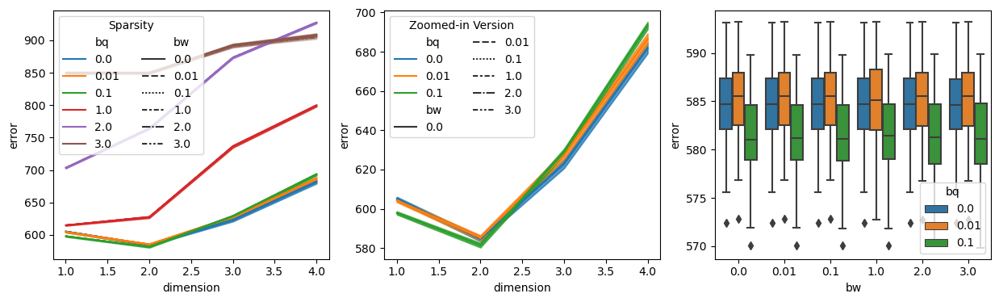

In [12]:
fig, ax = pyplot.subplots(1,3,figsize=(15,4))
a = valid_err_list.copy()
a['bw'] = a['bw'].astype('str')
a['bq'] = a['bq'].astype('str')
plot = sns.lineplot(data=a,y='error',x='dimension', hue='bq', style='bw', ax=ax[0])
ax[0].legend(loc='upper left',ncol=2, title="Sparsity")
a = valid_err_list.set_index(['dimension','bq','bw']).loc[:,[0.0,0.01,0.1],:].sort_index().reset_index()
a['bw'] = a['bw'].astype('str')
a['bq'] = a['bq'].astype('str')
plot = sns.lineplot(data=a,y='error',x='dimension', hue='bq', style='bw', ax=ax[1])
ax[1].legend(loc='upper left',ncol=2, title="Zoomed-in Version")
sns.boxplot(data=a.set_index('dimension').loc[2.0],y='error',x='bw', hue='bq',ax=ax[2])

In [13]:
# Given what we see above, looks like we can focus on d=2 and bq <=0.1.
# We now check if there are statistical differences between the remaining configurations
set_of_interest = valid_err_list.set_index(['dimension','bq','bw']).loc[2.0,:,:].sort_index() #.loc[2.0,[0.0,0.01,0.1],:].sort_index()
set_of_interest_dict = {}
set_of_interest_means = pd.Series(dtype='float64')

for d,bq,bw in set_of_interest.index:
    set_of_interest_dict[(d,bq,bw)]= set_of_interest.loc[d,bq,bw].values
set_of_interest_list = [v.flatten() for k,v in set_of_interest_dict.items()]
set_of_interest_labels = ['bW={b_W},bQ={b_Q}'.format(b_W=b_W, b_Q=b_Q) for d,b_Q,b_W in set_of_interest_dict.keys()]

In [14]:
set_of_interest_means = pd.Series(dtype='float64', index=set_of_interest_labels)
for d,bq,bw in set_of_interest.index:
    set_of_interest_means['bW={bw},bQ={bq}'.format(bw=bw, bq=bq)] = set_of_interest_dict[(d,bq,bw)].mean()

In [15]:
set_of_interest_means.sort_values().head(5)

bW=3.0,bQ=0.1     581.411054
bW=0.1,bQ=0.1     581.414975
bW=0.0,bQ=0.1     581.427152
bW=0.01,bQ=0.1    581.431142
bW=2.0,bQ=0.1     581.441179
dtype: float64

In [16]:
f_oneway(*set_of_interest_list)

F_onewayResult(statistic=25127.024719659537, pvalue=0.0)

In [17]:
#Now that we know there are statistical differences, we will do post-hoc t-tests between all cases to see which ones are the most useful
pval_df = sp.posthoc_ttest(set_of_interest_list, p_adjust = 'bonferroni')
pval_df.columns = set_of_interest_labels
pval_df.index   = set_of_interest_labels

(<AxesSubplot:>, <matplotlib.colorbar.Colorbar at 0x2aaaf77a9690>)

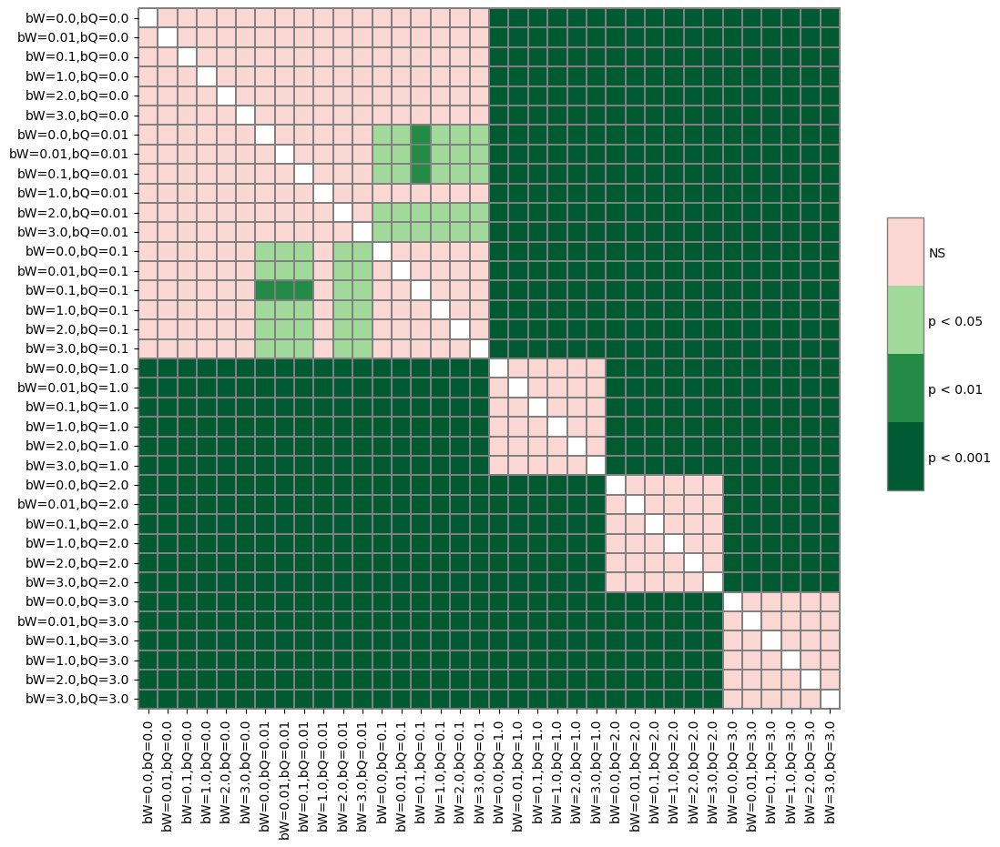

In [18]:
fig,ax=pyplot.subplots(1,1,figsize=(10,10))
heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [.95, 0.35, 0.04, 0.3], 'ax':ax}
sp.sign_plot(pval_df, **heatmap_args)

Ultimately, it looks like once you set bQ = 0.1, then all values of bW are equivalent.... for simplification purposes we go with bW=0

Similarly, it also looks like bW=0.01 and bQ=0 are equally optimal

I will try:

* bW=0.01 & bQ = 0.0
* bW=0.0 & bQ = 0.1

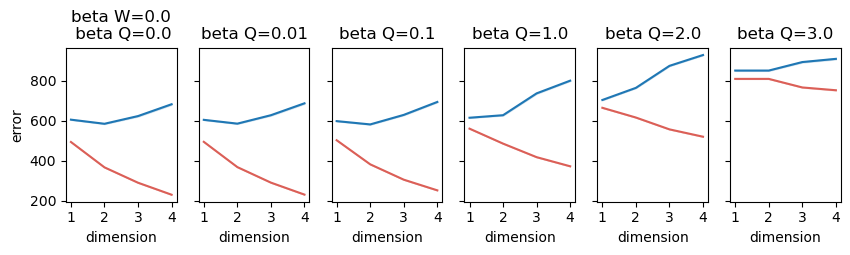

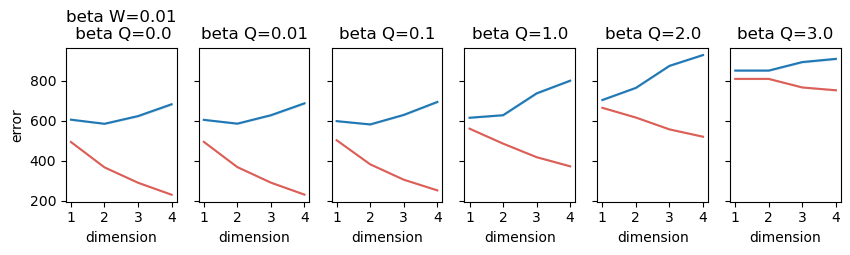

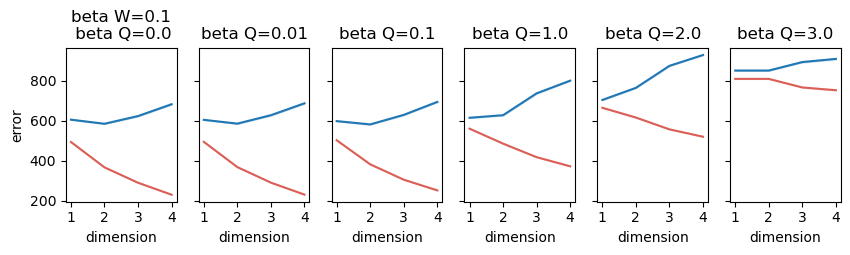

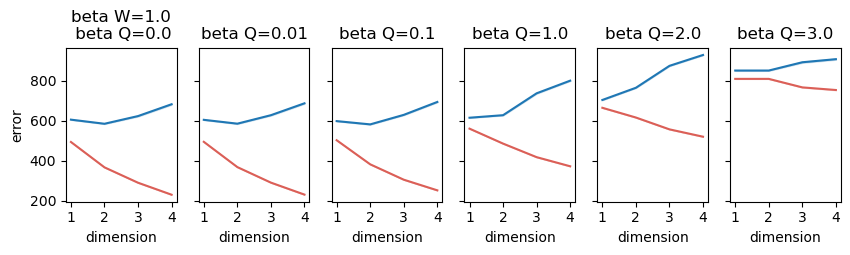

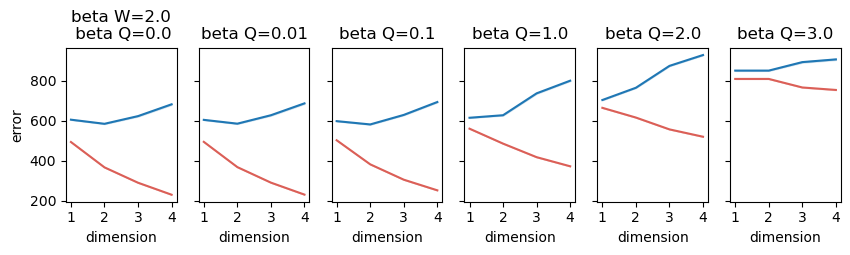

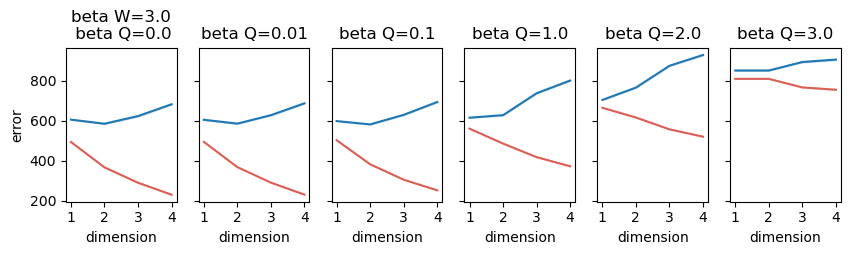

In [19]:
show_stats(train_err_list, valid_err_list)

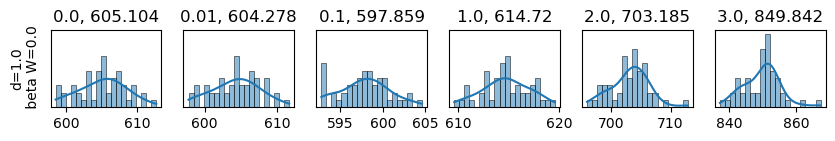

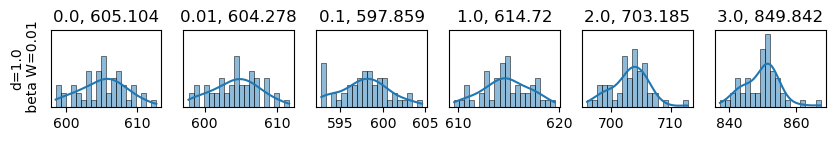

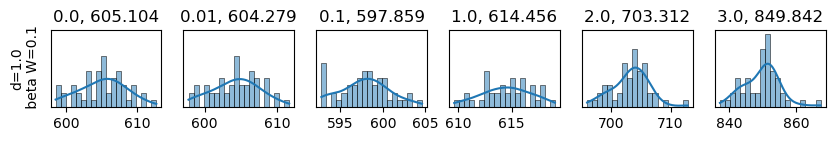

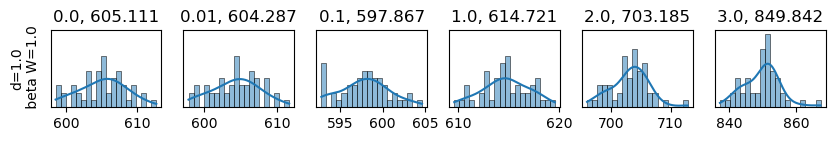

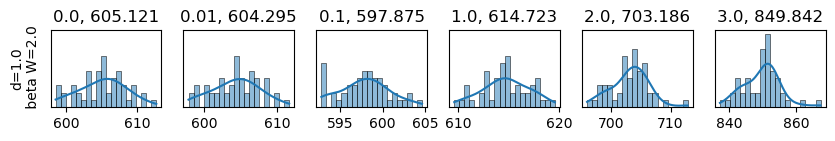

...

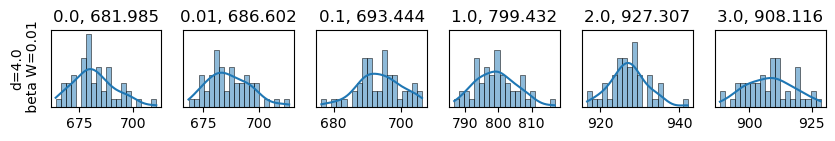

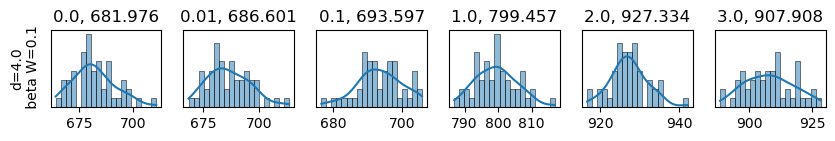

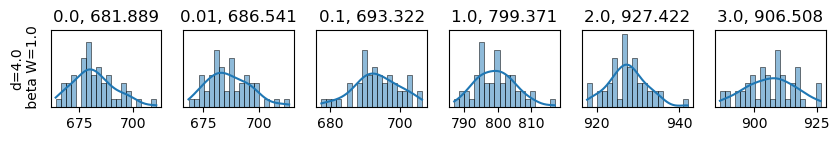

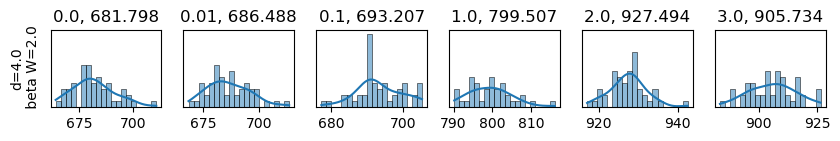

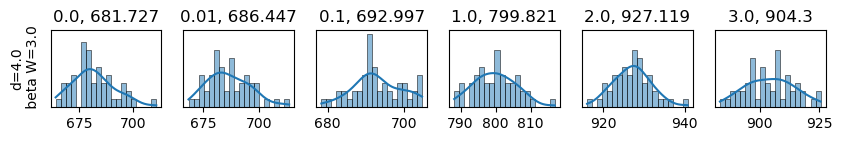

In [20]:
output_validation = show_distribution(stats)

In [21]:
# Are there significant differences in error across the different combinations of bW,bQ for d=2?
f_oneway(*output_validation)

F_onewayResult(statistic=25127.024719657118, pvalue=0.0)

In [22]:
# Becuase the omnibus F-test said yes, then we do post-hoc pairwise T-tests among all possible combinations
pval_df = sp.posthoc_ttest(output_validation, p_adjust = 'bonferroni')
print(pval_df.shape)

(36, 36)


In [23]:
config_list = []
for i in [0,0.01,0.1,1,2,3]:
    for j in [0,0.01,0.1,1,2,3]:
        config_list.append('bW={},bQ={}'.format(i,j))

In [24]:
# pval_df = pd.DataFrame(pval_df.values, columns=config_list)
pval_df = pd.DataFrame(pval_df.values, columns=config_list, index=config_list)
display(pval_df.iloc[[0,2],[0,2]])

,"bW=0,bQ=0","bW=0,bQ=0.1"
"bW=0,bQ=0",1.000000,0.200462
"bW=0,bQ=0.1",0.200462,1.000000


***
# 3. Without confound modeling, with intercept

In [37]:
stats, train_err_list, valid_err_list = load_errlist('./output/biowulf/stats_full_data_noconfound.csv')

In [49]:
# Print number of missing --> For some combinations of (d, b_W, b_Q), in some iterations no folds completed. Why?
N_expected = 4 * 7 * 7 * 50 * 10 # Also has results for 0.2
N_expected - stats.shape[0]

0

<AxesSubplot:xlabel='bw', ylabel='error'>

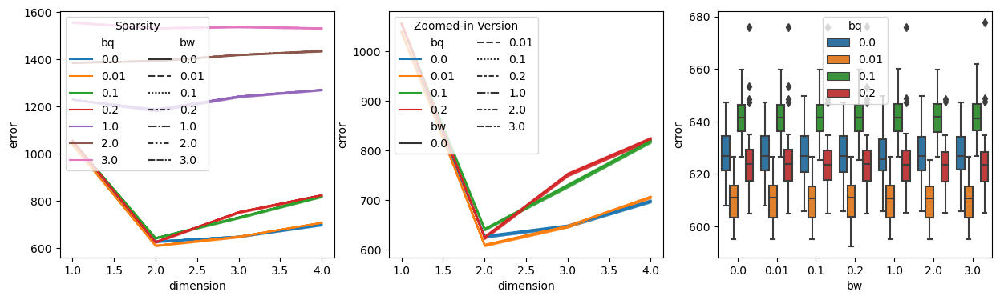

In [51]:
fig, ax = pyplot.subplots(1,3,figsize=(15,4))
a = valid_err_list.copy()
a['bw'] = a['bw'].astype('str')
a['bq'] = a['bq'].astype('str')
plot = sns.lineplot(data=a,y='error',x='dimension', hue='bq', style='bw', ax=ax[0])
ax[0].legend(loc='upper left',ncol=2, title="Sparsity")
a = valid_err_list.set_index(['dimension','bq','bw']).loc[:,[0.0,0.01,0.1,0.2],:].sort_index().reset_index()
a['bw'] = a['bw'].astype('str')
a['bq'] = a['bq'].astype('str')
plot = sns.lineplot(data=a,y='error',x='dimension', hue='bq', style='bw', ax=ax[1])
ax[1].legend(loc='upper left',ncol=2, title="Zoomed-in Version")
sns.boxplot(data=a.set_index('dimension').loc[2.0],y='error',x='bw', hue='bq',ax=ax[2])

In [52]:
# Given what we see above, looks like we can focus on d=2 and bq <=0.1.
# We now check if there are statistical differences between the remaining configurations
set_of_interest = valid_err_list.set_index(['dimension','bq','bw']).loc[2.0,:,:].sort_index() #.loc[2.0,[0.0,0.01,0.1],:].sort_index()
set_of_interest_dict = {}
set_of_interest_means = pd.Series(dtype='float64')

for d,bq,bw in set_of_interest.index:
    set_of_interest_dict[(d,bq,bw)]= set_of_interest.loc[d,bq,bw].values
set_of_interest_list = [v.flatten() for k,v in set_of_interest_dict.items()]
set_of_interest_labels = ['bW={b_W},bQ={b_Q}'.format(b_W=b_W, b_Q=b_Q) for d,b_Q,b_W in set_of_interest_dict.keys()]

In [53]:
set_of_interest_means = pd.Series(dtype='float64', index=set_of_interest_labels)
for d,bq,bw in set_of_interest.index:
    set_of_interest_means['bW={bw},bQ={bq}'.format(bw=bw, bq=bq)] = set_of_interest_dict[(d,bq,bw)].mean()

In [54]:
set_of_interest_means.sort_values().head(5)

bW=0.2,bQ=0.01    609.572886
bW=2.0,bQ=0.01    609.583268
bW=3.0,bQ=0.01    609.610977
bW=1.0,bQ=0.01    609.612946
bW=0.1,bQ=0.01    609.626387
dtype: float64

In [55]:
f_oneway(*set_of_interest_list)

F_onewayResult(statistic=62696.592951126746, pvalue=0.0)

In [56]:
#Now that we know there are statistical differences, we will do post-hoc t-tests between all cases to see which ones are the most useful
pval_df = sp.posthoc_ttest(set_of_interest_list, p_adjust = 'bonferroni')
pval_df.columns = set_of_interest_labels
pval_df.index   = set_of_interest_labels

(<AxesSubplot:>, <matplotlib.colorbar.Colorbar at 0x2aaaf6f83190>)

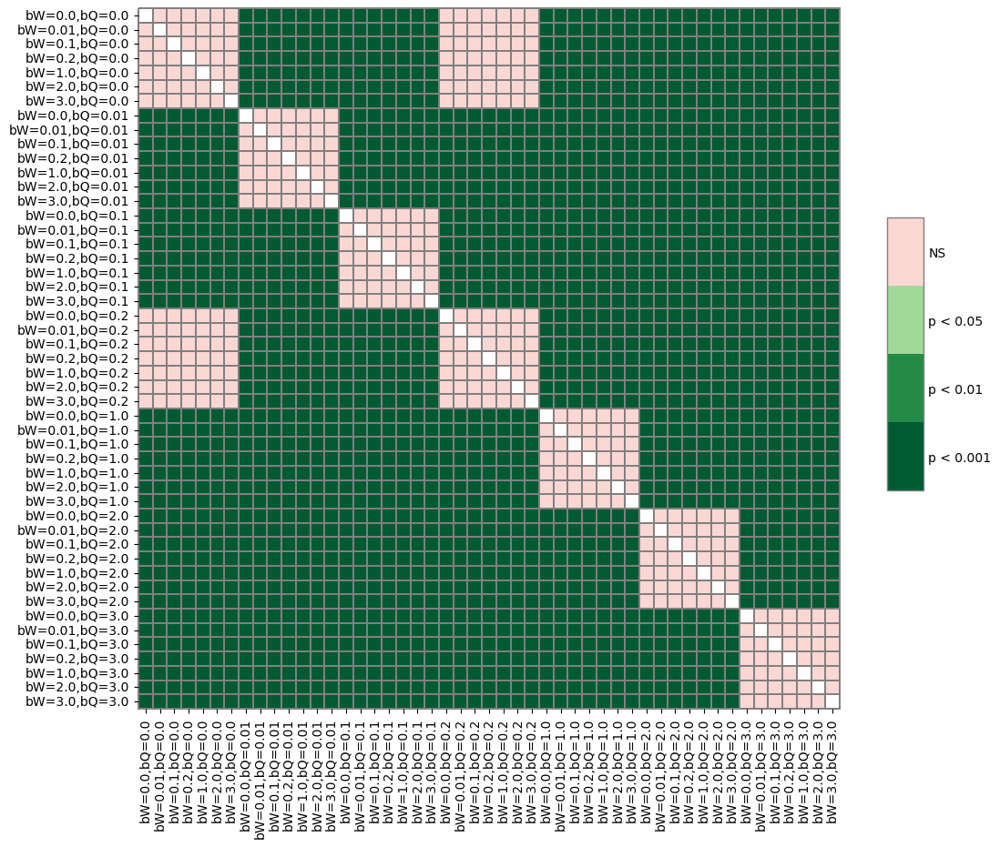

In [57]:
fig,ax=pyplot.subplots(1,1,figsize=(10,10))
heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [.95, 0.35, 0.04, 0.3], 'ax':ax}
sp.sign_plot(pval_df, **heatmap_args)

In [102]:
show_stats(train_err_list, valid_err_list)

<AxesSubplot:xlabel='dimension', ylabel='error'>

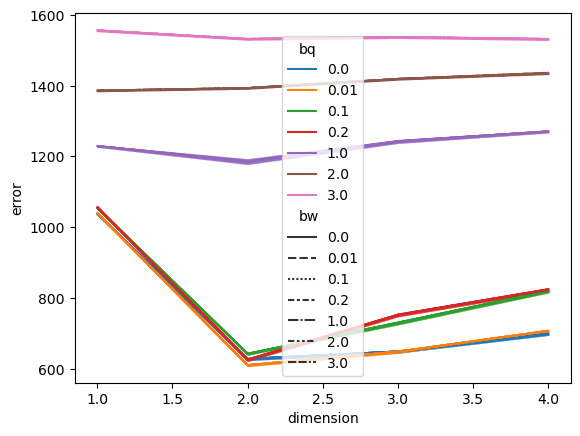

In [155]:
# Average across 50 iterations for each combination of (bq, bw and d)
a = valid_err_list.copy()
a['bw'] = a['bw'].astype('str')
a['bq'] = a['bq'].astype('str')
sns.lineplot(data=a,y='error',x='dimension', hue='bq', style='bw')

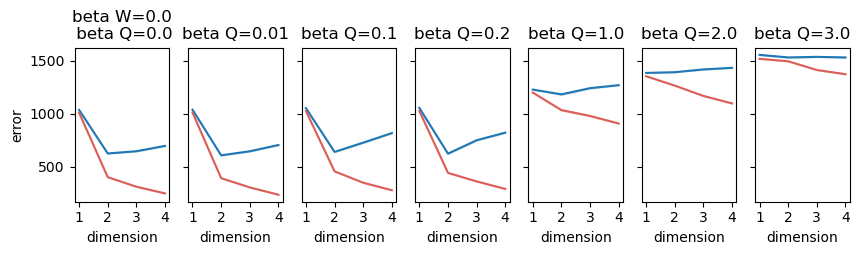

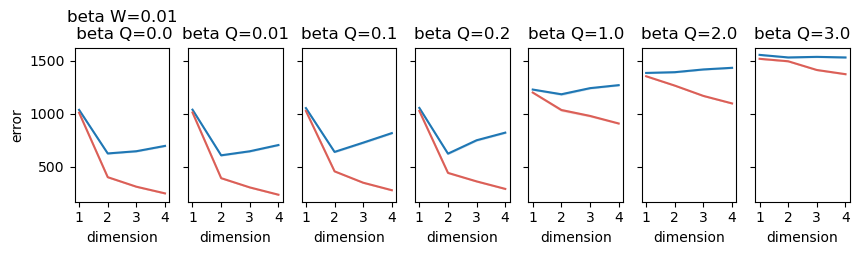

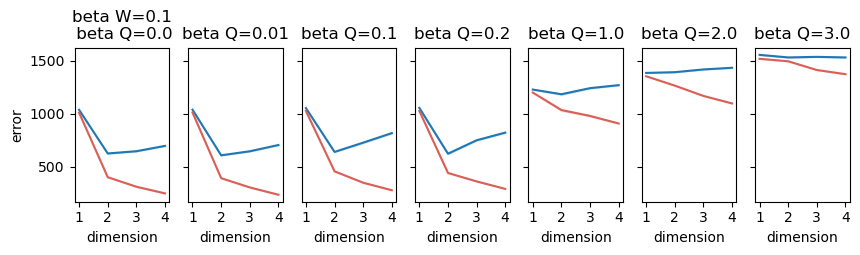

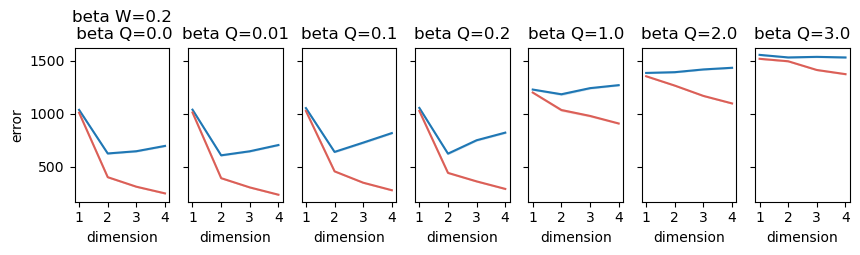

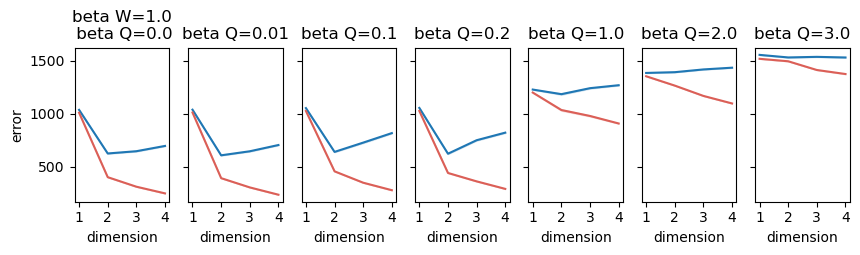

...

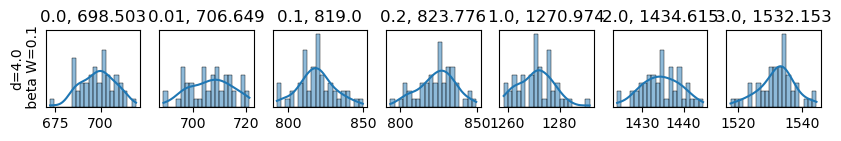

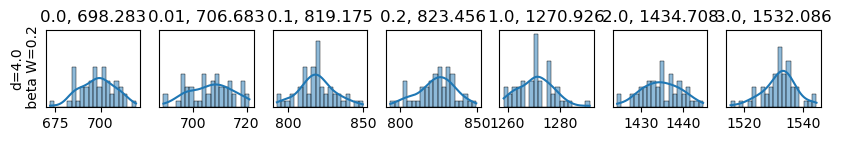

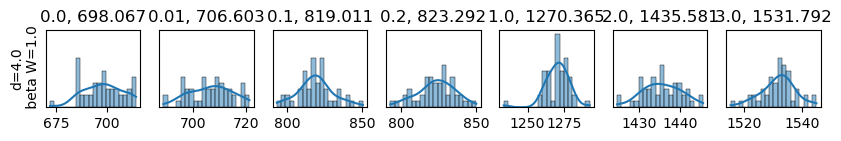

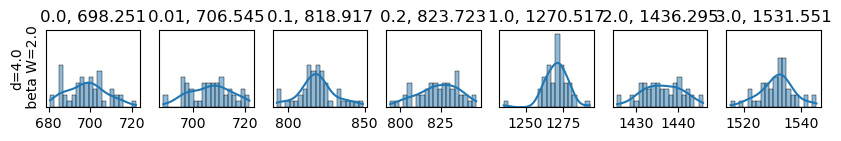

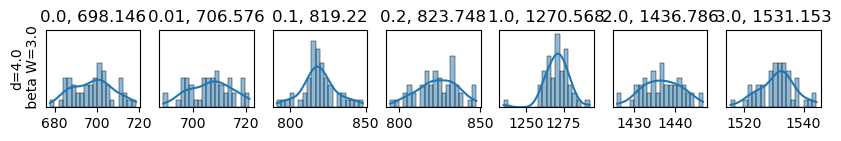

In [102]:
output_validation = show_distribution(stats)

In [107]:
f_oneway(*output_validation)

F_onewayResult(statistic=62696.59295111351, pvalue=0.0)

In [108]:
print([np.mean(v) for v in output_validation])
pval_df = sp.posthoc_ttest(output_validation, p_adjust = 'bonferroni')

[627.1984190942752, 609.6274923613573, 641.6395786914505, 625.2562777084896, 1184.1972715306586, 1393.154529457024, 1532.1571152322185, 627.1994496118054, 609.6271655189795, 641.6394397726816, 625.2556250142101, 1185.0573670813149, 1393.1539792256008, 1532.1570949888305, 627.0276932909821, 609.626387310966, 641.6247504052297, 624.6291383958877, 1185.3852074641256, 1393.1607070766884, 1532.1569178355467, 626.9927560516272, 609.5728861052338, 641.6329411857012, 625.2973087896744, 1185.0495755773286, 1393.1665435058542, 1532.1567188105096, 626.9374245174373, 609.6129461513601, 641.7679616246955, 624.6800856675686, 1186.0596403787565, 1393.2173136285094, 1532.1551633860126, 627.1642048836999, 609.5832676123847, 641.72558000767, 623.6949475113588, 1186.158711334208, 1393.3008761729775, 1532.152562507766, 626.8804072581428, 609.6109773683047, 641.8032359604538, 624.691016111323, 1186.317456584649, 1393.3735807766209, 1532.1466901871254]


In [116]:
config_list = []
for i in [0,0.01,0.1,0.2,1,2,3]:
    for j in [0,0.01,0.1,0.2,1,2,3]:
        config_list.append('bW={},bQ={}'.format(i,j))

In [117]:
pval_df = pd.DataFrame(pval_df.values, columns=config_list, index=config_list)
display(pval_df.iloc[[0,1,2],[0,1,2]])

,"bW=0,bQ=0","bW=0,bQ=0.01","bW=0,bQ=0.1"
"bW=0,bQ=0",1.000000e+00,4.141929e-15,2.931568e-10
"bW=0,bQ=0.01",4.141929e-15,1.000000e+00,1.112422e-34
"bW=0,bQ=0.1",2.931568e-10,1.112422e-34,1.000000e+00
